In [3]:
import os
os.environ["OMP_NUM_THREADS"] = "32"

In [2]:
from graph_tool.all import *
import pandas as pd
import numpy as np
import scipy as sp
from sklearn.covariance import LedoitWolf, OAS
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

In [4]:
### Input expression data
gene_expr_head = pd.read_table("/Genomics/ayroleslab2/lamaya/bigProject/eQTLcatalog/modularity/matrices/VOOMCounts_CPM5_counts4M_covfree_head_ctrl_onlygenesinmainchr_Jul20.21.txt")

In [5]:
gene_expr_dict = {"head": gene_expr_head.T}

In [6]:
gene_expr_dict["head"].mean(axis=0)

FBgn0031081     5.093763
FBgn0052350     3.535541
FBgn0024733    11.816455
FBgn0040372     3.972505
FBgn0023534     4.186527
                 ...    
FBgn0031318     5.024348
FBgn0031313     6.567976
FBgn0031305     5.238079
FBgn0016926     7.766387
FBgn0003310     4.660298
Length: 5584, dtype: float64

In [6]:
X_head = (gene_expr_dict["head"] - gene_expr_dict["head"].mean()) / np.sqrt(gene_expr_dict["head"].var())
oa = OAS(store_precision=True, assume_centered=True)
regularized_head_corr = oa.fit(X_head)

gene_expr_OAS_corr = {"head": regularized_head_corr}

In [7]:
g = load_graph("VOOMCounts_CPM5_counts4M_covfree_head_ctrl_onlygenesinmainchr_Jul20.21_regularized_correlations_precisions_spearman_correlation_cutoff_0.1.xml.gz")

In [8]:
def filterByEdge(g, corr, cutOff, keepOnlyMain):
    # Filtering edges
    corr = g.edge_properties[corr]
    sign = g.new_ep("bool", True)
    sign.a = np.array(corr.a > cutOff)

    tv = GraphView(g, efilt=sign)

    # Keeping largest component
    if keepOnlyMain:
        comp, hist = label_components(tv)
        main_component = tv.new_vp("bool", (comp.a == np.where(hist == max(hist))[0][0]))
        tv.vertex_properties["main_component"] = main_component
        tv.set_vertex_filter(main_component)
    return tv

In [78]:
tv = filterByEdge(g, "spearman", 0.55, True)
gf = Graph(tv, prune = True)

In [10]:
N = len(gf.get_vertices())
Et = (N * N - N)/2
E = len(gf.get_edges())
E/Et

0.02976396777456341

In [11]:
gf

<Graph object, undirected, with 1064 vertices and 16832 edges, 2 internal vertex properties, 5 internal edge properties, at 0x7f0b7d76cd00>

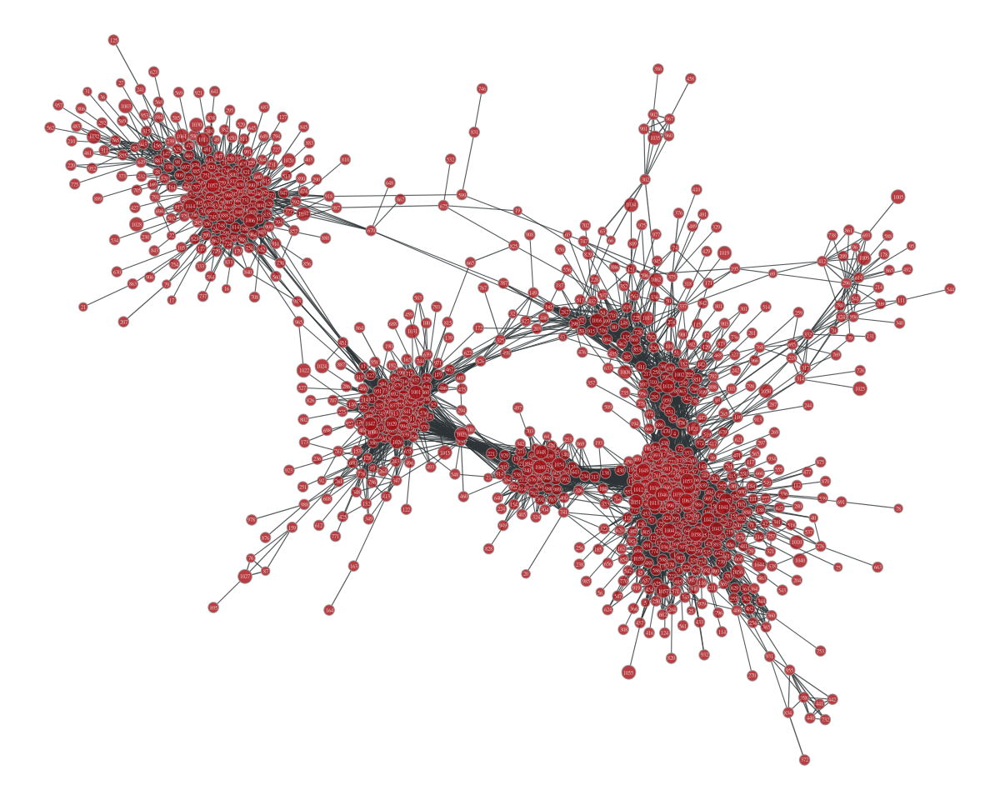

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f0b7d76cd00, at 0x7f0b03935820>

In [12]:
graph_draw(gf, vertex_text=gf.vertex_index, edge_pen_width=gf.edge_properties["spearman"])

In [103]:
state_min_nn = minimize_blockmodel_dl(gf)
mcmc_equilibrate(state_min_nn, wait=500, mcmc_args=dict(niter=10))

(35318.90080300493, 61933241, 14146063)

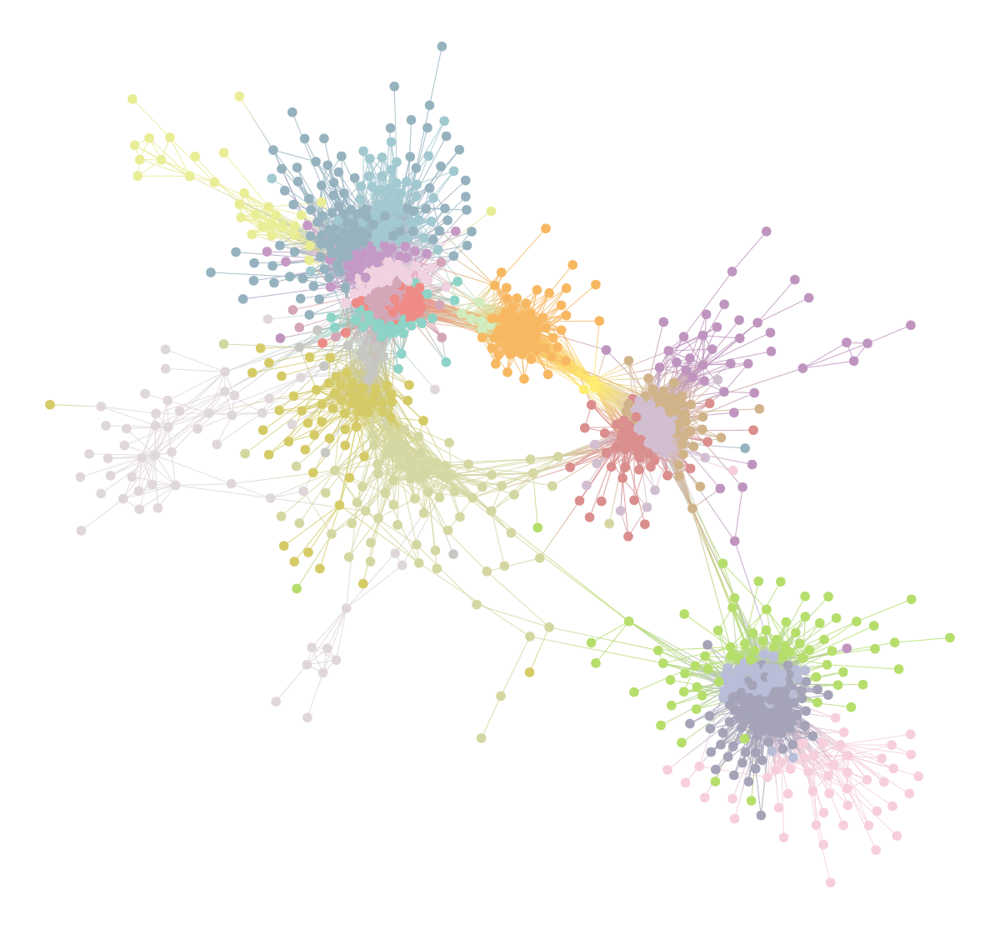

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f0931591250, at 0x7f0931790400>

In [104]:
state_min_nn.draw()

In [18]:
def create_Block_df(g, state):
    genes = g.vertex_properties["genes"]
    corr = g.edge_properties["correlation"]
    block_df = pd.DataFrame(columns=('Gene', "Degree", "E_corr", 'Block'))
    for v in g.vertex_index:
        line = [genes[v]]
        line.append(g.get_total_degrees([v])[0])
        line.append(np.mean(g.get_all_edges(v, [corr] )[:,2]))
        line.append(state.get_blocks()[v])
        block_df.loc[v] = line
    return block_df

In [19]:
block_df = create_Block_df(gf, state_min_nn)
block_df
#block_df.to_csv("../data/1502genes-non_hierarchical_sbm-fit_head_df.csv")

,Gene,Degree,E_corr,Block
0,FBgn0024733,108,0.513545,136
1,FBgn0023537,15,0.447663,892
2,FBgn0000108,102,0.490914,921
3,FBgn0002579,117,0.571531,878
4,FBgn0026879,13,0.434877,136
...,...,...,...,...
1059,FBgn0000579,21,0.454064,892
1060,FBgn0021906,54,0.492670,473
1061,FBgn0031306,7,0.442221,921
1062,FBgn0031313,6,0.444933,352


In [20]:
n_trials = 10
state_min_list = []
for i in range(n_trials):
    print(i, end = " ")
    #state_min = minimize_nested_blockmodel_dl(gf, state_args=dict(recs=[corr],
    #                                                              rec_types=["real-normal"]))
    state_min = minimize_nested_blockmodel_dl(gf)
    state_min_list.append(state_min)

0 1 2 3 4 5 6 7 8 9 

In [21]:
# improve solution with merge-split
# state_min = state_min.copy(bs=state_min.get_bs() + [np.zeros(1)] * 4, sampling=True)

ret = []
state_mcmc_list = []
for j in range(n_trials):
    print(j, end = " ")
    for i in range(200):
        state = state_min_list[j].copy(sampling = True)
        x = state.multiflip_mcmc_sweep(niter=20, beta=np.inf)
        state_mcmc_list.append(state)
        ret.append(x)

description_lenghts = np.zeros(n_trials)
for j in range(n_trials):
    description_lenghts[j] = state_mcmc_list[j].entropy()
min_index = np.argmin(description_lenghts)
state_min = state_mcmc_list[min_index]
description_lenghts

0 1 2 3 4 5 6 7 8 9 

array([34108.3828679 , 34117.57204363, 34124.60289633, 34121.74814461,
       34119.29696145, 34136.01804044, 34121.78584279, 34079.00822791,
       34118.08561755, 34095.68485527])

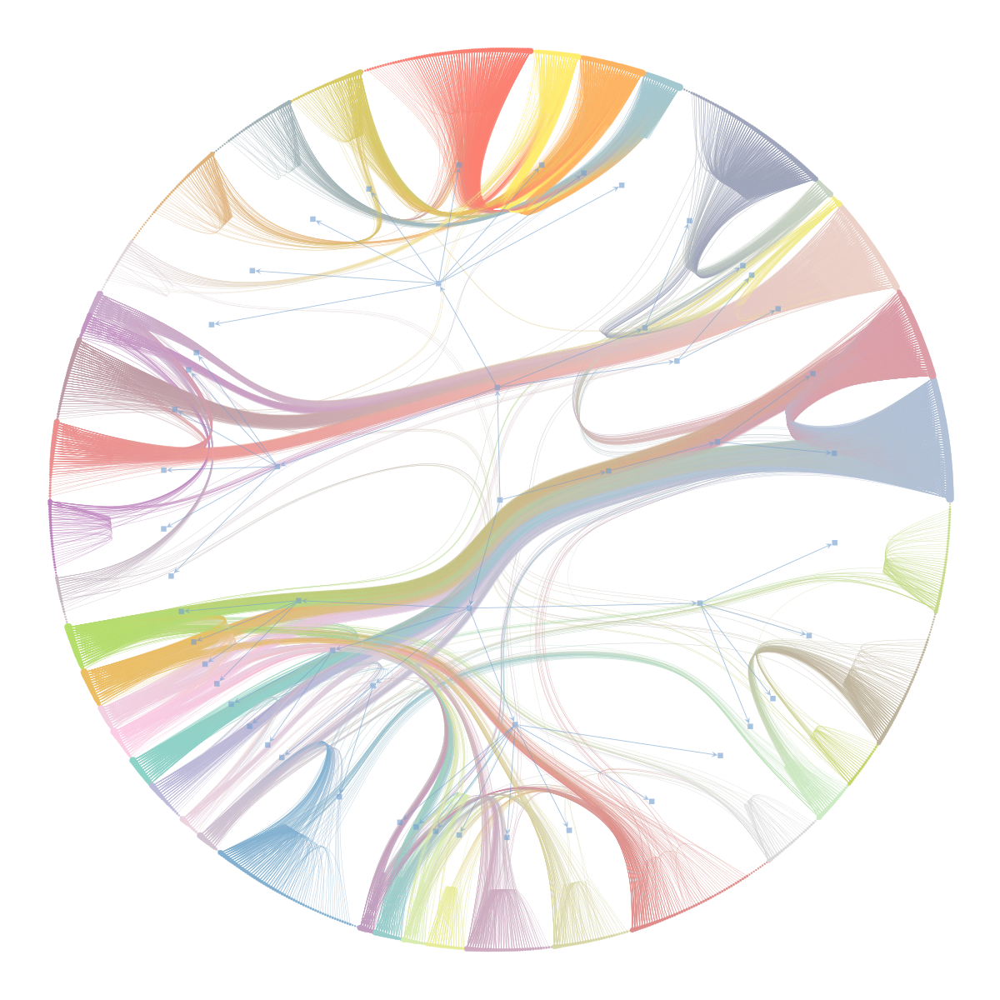

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f0b7d76cd00, at 0x7f0933e362b0>,
 <Graph object, directed, with 1119 vertices and 1118 edges, at 0x7f0ac7cb0ac0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f0ac7cb0ac0, at 0x7f0933e28400>)

In [24]:
state_min.draw(hsize_scale = 10, vsize_scale = 5, subsample_edges = 10000)

In [105]:
gr = gf.copy()

#state_gr = minimize_blockmodel_dl(gr)
random_rewire(gr, model = 'constrained-configuration')
state_gr = minimize_nested_blockmodel_dl(gr)
state_gr_nn = minimize_blockmodel_dl(gr)
state_gr_pp = minimize_blockmodel_dl(gr, state=PPBlockState)

In [106]:
print("Nested")
mcmc_equilibrate(state_gr, wait = 100, mcmc_args=dict(niter=10))
print("Non nested")
mcmc_equilibrate(state_gr_nn, wait = 100, mcmc_args=dict(niter=10))
print("PP")
mcmc_equilibrate(state_gr_pp, wait = 100, mcmc_args=dict(niter=10))

Nested
Non nested
PP


(53501.547642449004, 34726137, 5487875)

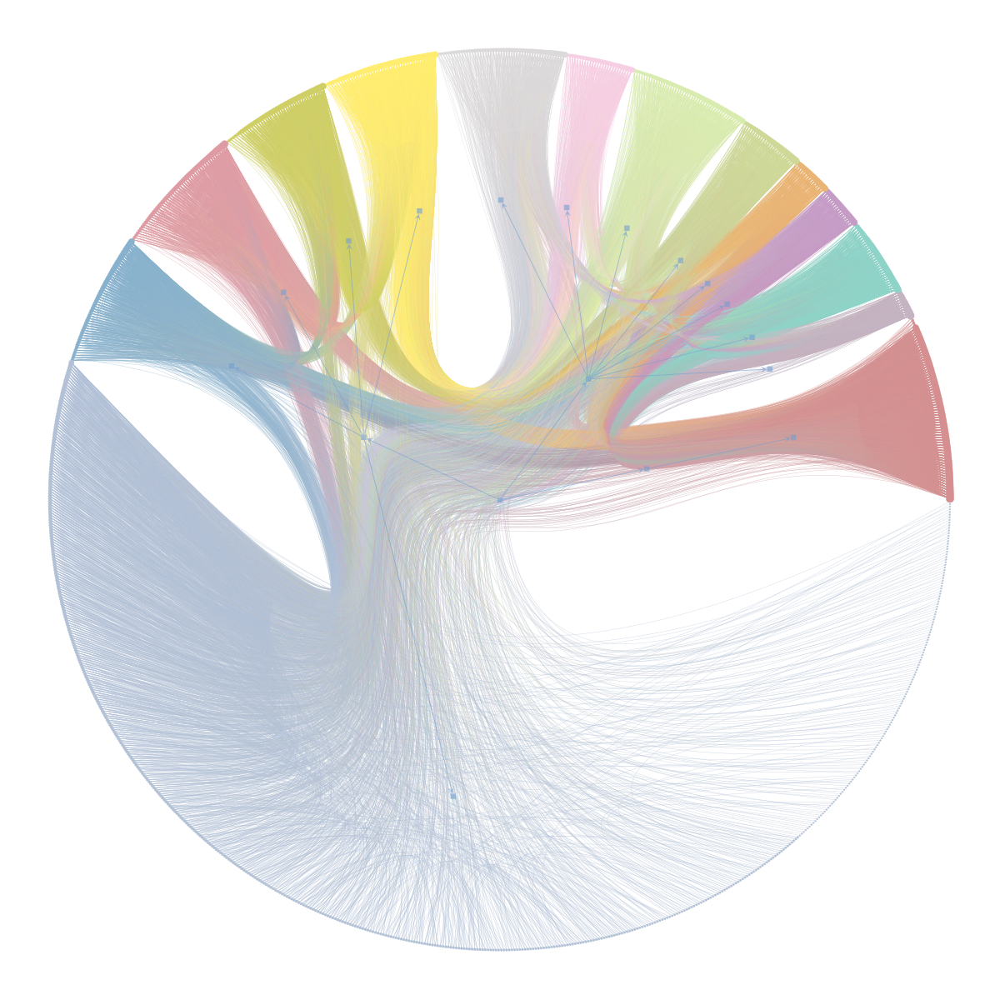

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f09317edfa0, at 0x7f0931ccb490>,
 <Graph object, directed, with 1082 vertices and 1081 edges, at 0x7f09317a3400>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f09317a3400, at 0x7f09317f21f0>)

In [97]:
state_gr.draw()

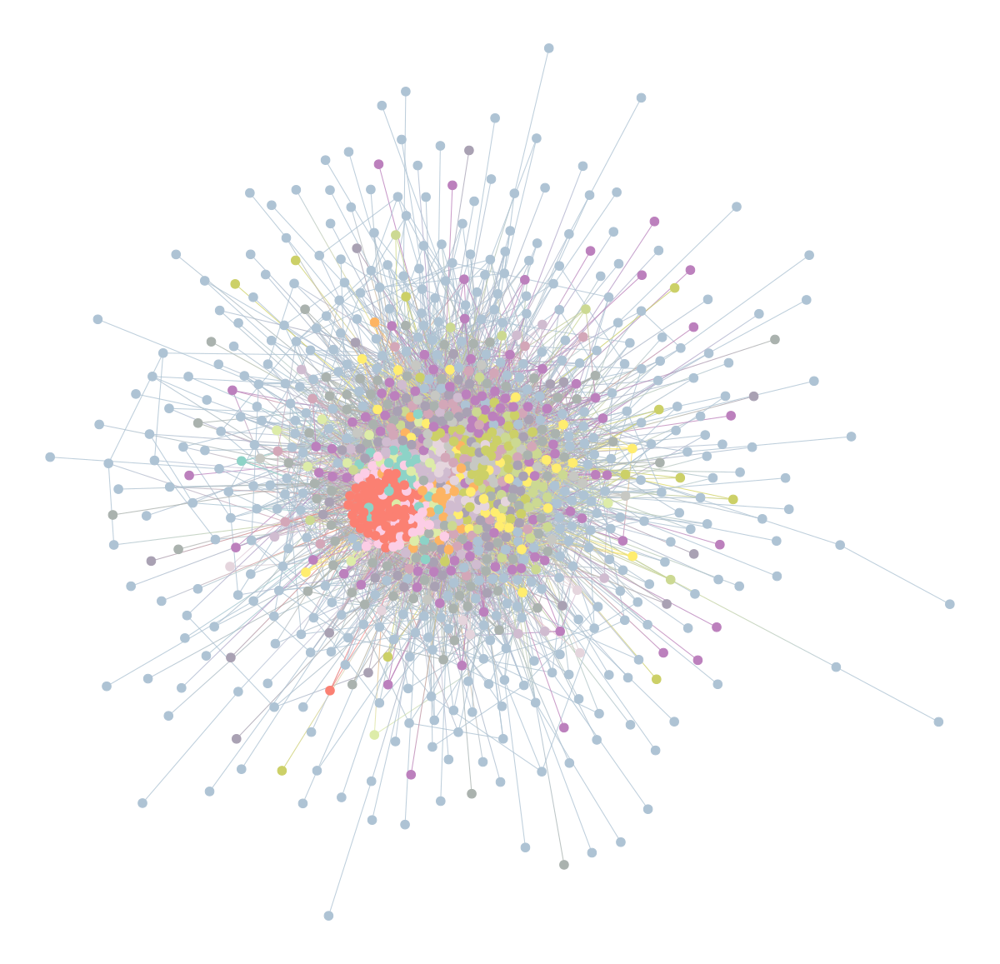

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f093184adc0, at 0x7f0933ea5100>

In [107]:
state_gr_nn.draw()

In [122]:
set(state_gr.get_bs()[0])

{4,
 7,
 187,
 345,
 349,
 368,
 376,
 420,
 486,
 527,
 536,
 546,
 575,
 665,
 920,
 961,
 969}

In [177]:
def get_group(x, state):
    levels = state.get_levels()
    n_levels = 6#len(levels)
    r = np.zeros(n_levels)
    r[0] = levels[0].get_blocks()[x]
    for i in range(1, n_levels):
        r[i] = levels[i].get_blocks()[r[i-1]]
    r = r.astype(int)
    return r
def create_nestedBlock_df(g, state):
    genes = g.vertex_properties["genes"]
    correlation = g.edge_properties["correlation"]
    nested_block_df = pd.DataFrame(columns=('Gene', "Degree", "E_corr", 'B1', "B2", "B3", "B4", "B5", "B6"))
    for v in g.vertex_index:
        line = [genes[v]]
        line.append(g.get_total_degrees([v])[0])
        line.append(np.mean(g.get_all_edges(v, [correlation] )[:,2]))
        [line.append(i) for i in get_group(v, state)]
        nested_block_df.loc[v] = line
    return nested_block_df

In [65]:
nested_block_df = create_nestedBlock_df(gf, state_min)

In [66]:
nested_block_df
#nested_block_df.to_csv("../data/1502genes-Control_Head-hsbm-fit_df.csv")

,Gene,Degree,E_corr,B1,B2,B3,B4,B5
0,FBgn0024733,211,0.445620,1394,12,20,4,0
1,FBgn0023537,73,0.397302,799,84,14,4,0
2,FBgn0000108,225,0.436224,389,34,6,2,0
3,FBgn0025640,16,0.362250,617,71,8,0,0
4,FBgn0025638,3,0.375419,1186,43,24,0,0
...,...,...,...,...,...,...,...,...
2017,FBgn0021906,107,0.432894,617,71,8,0,0
2018,FBgn0028481,2,0.326209,1336,52,6,2,0
2019,FBgn0031306,56,0.376361,1624,52,6,2,0
2020,FBgn0031313,28,0.393526,525,68,24,0,0


In [ ]:
bs = []
h = [np.zeros(gf.num_vertices() + 1) for s in state_min.get_levels()]

def collect_partitions(s):
    global bs
    bs.append(s.get_bs())
    for l, sl in enumerate(s.get_levels()):
       B = sl.get_nonempty_B()
       h[l][B] += 1
   

# Now we collect the marginals for exactly 100,000 sweeps
mcmc_equilibrate(state_min, force_niter=10000, mcmc_args=dict(niter=10),
                    callback=collect_partitions)

In [ ]:
# Disambiguate partitions and obtain marginals
pmode = PartitionModeState(bs, nested=True, converge=True)

In [184]:
pmode

In [170]:
pv = pmode.get_marginal(gf)

# Get consensus estimate
bs = pmode.get_max_nested()

state = state_min.copy(bs=bs)

In [193]:
for i in gf.get_vertices():
    print(pv[i])

array([7491,    0,    0,   51,    0,    0,    0,  136,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,  951,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,   38,   52,    0,
         75,    0,    2,    0,    0,   26,    0,    0,  208,    0,    0,
          0,   23,  149,    0,    0,    0,    0,    0,    0,    0,    0,
        559,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,   55,   19,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,   54,    0,    0,
          0,    0,    2,    0,   34,   25,    0,    0,    0,    1,    9,
          0,    0,    0,    0,    1,    0,    9,    0,    0,    3,    0,
          0,   17,    0,    8,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    1], dtype=int32)
array([   0, 9999], dtype=int32)
array([   0,    0, 9999], dtype=int32)
array([   0, 

          0,    0,    0,    0,    0,    0,    0, 9999], dtype=int32)
array([   0,    0,    0,    0,    0,  135,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,   65,    0,    0,    0,    0,    0,
          0,    0,    0,    0, 2907,    0,    0,    0,    0,    0, 6325,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    7,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,  515,    0,    0,    0,
          1,    0,    0,    0,    1,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,   22,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,   21], dtype=int32)
array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0

array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0, 9756,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,  206,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,   37], dtype=int32)
array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0, 9999], dtype=int32)
array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    6,    0,    0,    0,   82,
          0,    0,    0, 6558,    0,    4,    0,  378,    0,    0,    0,
          0,    0,    0,    0,  918,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    

array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,   10,    0,    0,    0,   10,    0,    0,    0,    0,
          0,    1,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0, 5685, 1520,    0,    0,    0,    0,    0,    0,
          2,    0,    0,  767,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    2,   97,    0,    0,    0,    0,
         78,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,  706,    0,    0,    0,    0,    0,    0,    0,    0,
          0,  126,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          5,    9,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,  643,  270,    2,    0,    0,    5,    0,
          0,    0,   61], dtype=int32)
array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,

In [173]:
state_min.entropy() - state.entropy()

690.9768350028899

In [178]:
create_nestedBlock_df(gf, state)

,Gene,Degree,E_corr,B1,B2,B3,B4,B5,B6
0,FBgn0031081,2,0.346404,0,0,13,6,1,0
1,FBgn0024733,293,0.410842,1,1,1,1,3,0
2,FBgn0023537,124,0.373595,2,2,2,9,3,0
3,FBgn0000108,312,0.406633,3,3,13,6,1,0
4,FBgn0025640,53,0.337014,115,7,18,2,3,0
...,...,...,...,...,...,...,...,...,...
2810,FBgn0053126,3,0.294987,44,21,8,0,1,0
2811,FBgn0028481,7,0.300171,18,0,13,6,1,0
2812,FBgn0031306,106,0.350551,46,0,13,6,1,0
2813,FBgn0031313,55,0.362580,130,26,4,1,3,0


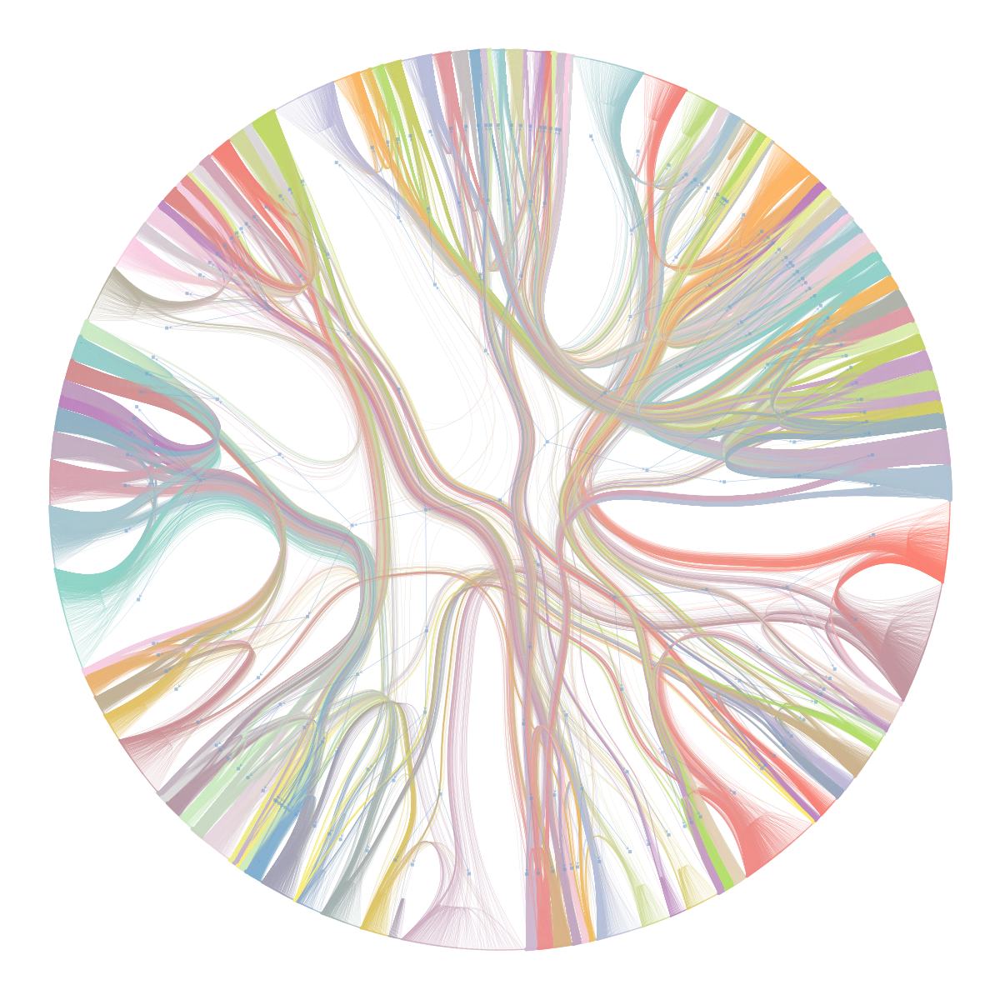

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7efbc1a63430, at 0x7efb52140430>,
 <Graph object, directed, with 3018 vertices and 3017 edges, at 0x7efb50ed2820>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7efb50ed2820, at 0x7efb585c8f40>)

In [136]:
# We can visualize the marginals as pie charts on the nodes:
state.draw()

In [179]:
# We can visualize the marginals as pie charts on the nodes:
state.get_levels()

[<BlockState object with 135 blocks (134 nonempty), degree-corrected, for graph <Graph object, undirected, with 2815 vertices and 85775 edges, 2 internal vertex properties, 5 internal edge properties, at 0x7efbc1a63430>, at 0x7efb502bb100>,
 <BlockState object with 47 blocks (40 nonempty), for graph <Graph object, undirected, with 135 vertices and 2116 edges, at 0x7efb4bd648e0>, at 0x7efb4bb28160>,
 <BlockState object with 30 blocks (17 nonempty), for graph <Graph object, undirected, with 47 vertices and 350 edges, at 0x7efb4bb316a0>, at 0x7efb4be11490>,
 <BlockState object with 10 blocks (8 nonempty), for graph <Graph object, undirected, with 30 vertices and 96 edges, at 0x7efb4bb3e160>, at 0x7efb4bb31d60>,
 <BlockState object with 4 blocks (3 nonempty), for graph <Graph object, undirected, with 10 vertices and 29 edges, at 0x7efb4bb3ea00>, at 0x7efb4bb3e820>,
 <BlockState object with 1 blocks (1 nonempty), for graph <Graph object, undirected, with 4 vertices and 6 edges, at 0x7efb4bb

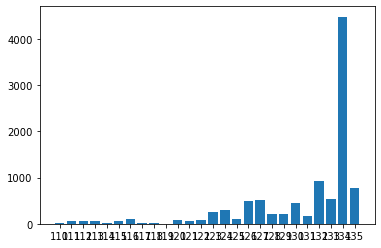

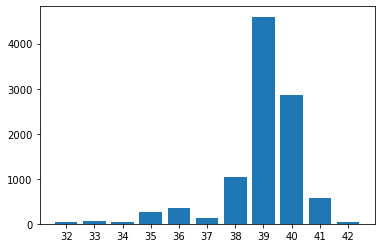

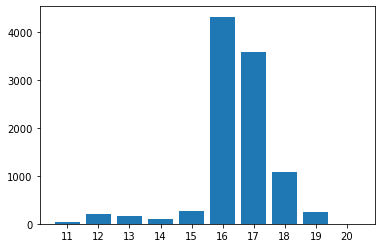

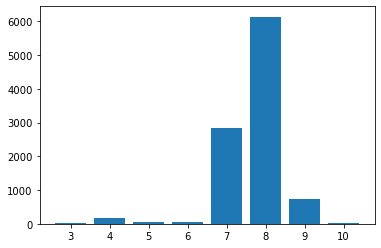

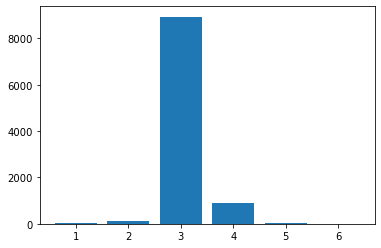

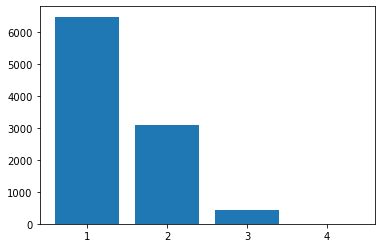

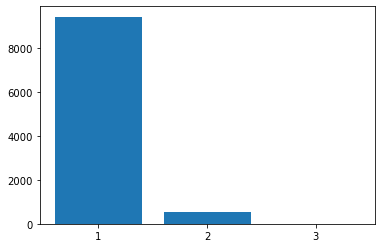

In [165]:
# Make a random dataset:
for i in range(7):
    clusters =  h[i]
    mask = np.where(clusters != 0)
    height = clusters[mask]
    bars = mask[0]
    y_pos = np.arange(len(height))

    # Create bars
    plt.bar(y_pos, height)

    # Create names on the x-axis
    plt.xticks(y_pos, bars)
    plt.show()

In [194]:
pd.DataFrame(h).to_csv("../data/output/SBM/clustering/head_cutoff-spearman_val-0.4_hierarchical-SBM_levels_histogram.csv")


8